# Problem statement
Schuster is a multinational retail company would like to know more about customers payment behavior 
from their past payment data,
Schuster would also like to predict the likelihood of delayed payment using historical data.
This should help the collection department to prioritize their work on customers accordingly and save time and money and also brand value by following up only with the right customers.

In [2]:
# Imporinting needed libraries
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns
import statsmodels.api as sm
import warnings
warnings.filterwarnings("ignore")

In [3]:
past_data=pd.read_csv("Received_Payments_Data.csv")

In [4]:
past_data.shape

(93937, 16)

In [5]:
past_data.columns

Index(['RECEIPT_METHOD', 'CUSTOMER_NAME', 'CUSTOMER_NUMBER', 'RECEIPT_DOC_NO',
       'RECEIPT_DATE', 'CLASS', 'CURRENCY_CODE', 'Local Amount', 'USD Amount',
       'INVOICE_ALLOCATED', 'INVOICE_CREATION_DATE', 'DUE_DATE',
       'PAYMENT_TERM', 'INVOICE_CLASS', 'INVOICE_CURRENCY_CODE',
       'INVOICE_TYPE'],
      dtype='object')

In [6]:
past_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93937 entries, 0 to 93936
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   RECEIPT_METHOD         93937 non-null  object 
 1   CUSTOMER_NAME          93937 non-null  object 
 2   CUSTOMER_NUMBER        93937 non-null  int64  
 3   RECEIPT_DOC_NO         93908 non-null  float64
 4   RECEIPT_DATE           93937 non-null  object 
 5   CLASS                  93937 non-null  object 
 6   CURRENCY_CODE          93937 non-null  object 
 7   Local Amount           93937 non-null  float64
 8   USD Amount             93937 non-null  float64
 9   INVOICE_ALLOCATED      93937 non-null  object 
 10  INVOICE_CREATION_DATE  93937 non-null  object 
 11  DUE_DATE               93937 non-null  object 
 12  PAYMENT_TERM           93937 non-null  object 
 13  INVOICE_CLASS          93937 non-null  object 
 14  INVOICE_CURRENCY_CODE  93937 non-null  object 
 15  IN

In [7]:
past_data.isna().mean()

RECEIPT_METHOD           0.000000
CUSTOMER_NAME            0.000000
CUSTOMER_NUMBER          0.000000
RECEIPT_DOC_NO           0.000309
RECEIPT_DATE             0.000000
CLASS                    0.000000
CURRENCY_CODE            0.000000
Local Amount             0.000000
USD Amount               0.000000
INVOICE_ALLOCATED        0.000000
INVOICE_CREATION_DATE    0.000000
DUE_DATE                 0.000000
PAYMENT_TERM             0.000000
INVOICE_CLASS            0.000000
INVOICE_CURRENCY_CODE    0.000000
INVOICE_TYPE             0.000000
dtype: float64

In [8]:
# With happy to see clean data lets check categorical values
past_data=past_data.drop("RECEIPT_DOC_NO", axis=1)

In [9]:
past_data[['Local Amount','USD Amount']]

,Local Amount,USD Amount
0,370990.92,101018.63040
1,183750.00,48990.21133
2,157500.00,41991.60971
3,157500.00,41991.60971
4,157500.00,41991.60971
...,...,...
93932,59914.50,59914.50000
93933,59914.50,59914.50000
93934,59914.50,59914.50000
93935,23574.33,23574.33000


In [10]:
past_data=past_data.drop("Local Amount", axis=1)

In [11]:
past_data["DUE_DATE"]=pd.to_datetime(past_data.DUE_DATE , format="%d-%b-%y")

In [12]:
past_data['RECEIPT_DATE']=pd.to_datetime(past_data.RECEIPT_DATE, format="%d-%b-%y")

In [13]:
past_data['is_late_payment']=past_data.RECEIPT_DATE>past_data.DUE_DATE

In [14]:
past_data=past_data.drop("RECEIPT_DATE",axis=1)

In [15]:
past_data['is_late_payment']=past_data.is_late_payment.map({True:1,False:0})

- R (Recency): Number of days since last purchase
- F (Frequency): Number of tracsactions
- M (Monetary): Total amount of transactions (revenue contributed)

In [17]:
late_payers=past_data.groupby("CUSTOMER_NUMBER")['is_late_payment'].mean()
late_payers=late_payers.reset_index()
late_payers.columns=['CUSTOMER_NUMBER','late_payers_mean']
late_payers

,CUSTOMER_NUMBER,late_payers_mean
0,1044,0.719912
1,1076,0.472000
2,1146,0.833333
3,1154,0.659574
4,1192,1.000000
...,...,...
1049,52762,0.000000
1050,52800,0.000000
1051,52802,1.000000
1052,52820,0.000000


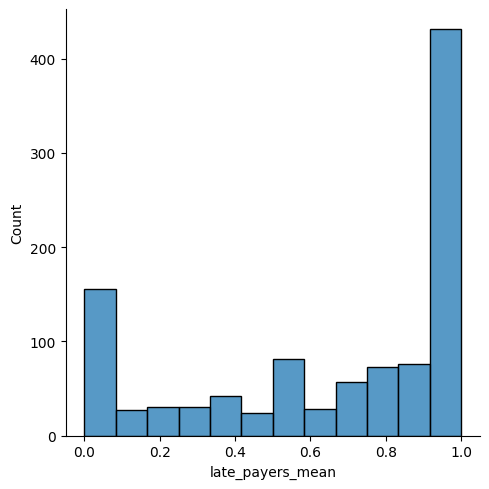

In [18]:
sns.displot(late_payers.late_payers_mean)

<Axes: ylabel='late_payers_mean'>

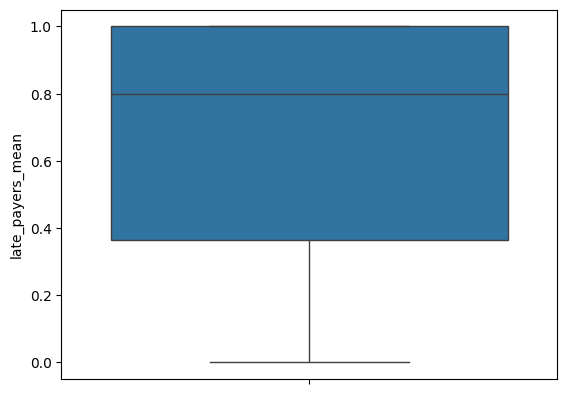

In [19]:
sns.boxplot(late_payers.late_payers_mean)

In [20]:
past_data['Due_month']=past_data.DUE_DATE.dt.month

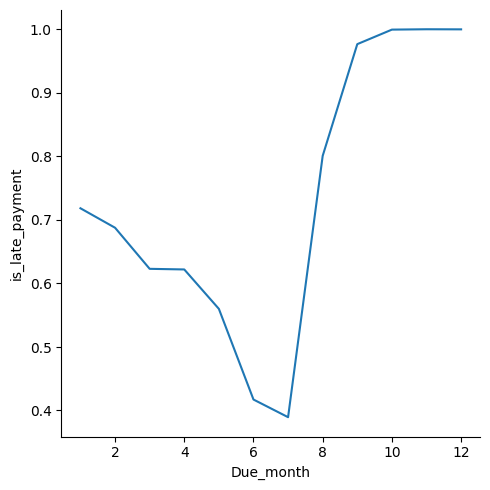

In [21]:
sns.relplot(past_data.groupby("Due_month")['is_late_payment'].mean(), kind='line')

In [22]:
past_data=past_data.drop("Due_month",axis=1)

In [23]:
monetory=past_data.groupby("CUSTOMER_NUMBER")['USD Amount'].sum()
monetory=monetory.reset_index()
monetory.columns=['CUSTOMER_NUMBER','monetory']

In [24]:
pd.set_option('display.float_format', '{:,.0f}'.format)

In [25]:
frequency=past_data.groupby("CUSTOMER_NUMBER")['INVOICE_ALLOCATED'].count()
frequency=frequency.reset_index()
frequency.columns=['CUSTOMER_NUMBER','frequency']

In [26]:
recency=past_data.groupby("CUSTOMER_NUMBER")['DUE_DATE'].max()
recency=recency.reset_index()
recency.columns=['CUSTOMER_NUMBER','recency']
recency.head()

,CUSTOMER_NUMBER,recency
0,1044,2021-08-30
1,1076,2021-06-25
2,1146,2021-05-30
3,1154,2021-08-30
4,1192,2021-04-30


In [27]:
grouped_df=pd.merge(monetory,frequency, on="CUSTOMER_NUMBER", how='inner')

In [28]:
pd.merge(past_data,late_payers, on="CUSTOMER_NUMBER", how='left')

,RECEIPT_METHOD,CUSTOMER_NAME,CUSTOMER_NUMBER,CLASS,CURRENCY_CODE,USD Amount,INVOICE_ALLOCATED,INVOICE_CREATION_DATE,DUE_DATE,PAYMENT_TERM,INVOICE_CLASS,INVOICE_CURRENCY_CODE,INVOICE_TYPE,is_late_payment,late_payers_mean
0,WIRE,C EA Corp,37403,PMT,USD,"101,019",14200000001,2-Nov-20,2020-12-30,30 Days from EOM,INV,AED,Non Goods,1,1
1,WIRE,RADW Corp,4003,PMT,SAR,"48,990",99200000043,29-Dec-20,2021-01-28,30 Days from Inv Date,INV,SAR,Non Goods,1,0
2,WIRE,RADW Corp,4003,PMT,SAR,"41,992",99210000003,30-Jan-21,2021-03-01,30 Days from Inv Date,INV,SAR,Non Goods,0,0
3,WIRE,FARO Corp,1409,PMT,SAR,"41,992",99200000038,15-Dec-20,2021-01-14,30 Days from Inv Date,INV,SAR,Non Goods,1,1
4,WIRE,RADW Corp,4003,PMT,SAR,"41,992",99200000039,15-Dec-20,2021-01-14,30 Days from Inv Date,INV,SAR,Non Goods,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93932,WIRE,PEAR Corp,21144,PMT,USD,"59,914",2.842E+11,28-Dec-20,2020-12-28,Immediate,CM,USD,Goods,1,1
93933,WIRE,PEAR Corp,21144,PMT,USD,"59,914",2.842E+11,28-Dec-20,2020-12-28,Immediate,CM,USD,Goods,1,1
93934,WIRE,PEAR Corp,21144,PMT,USD,"59,914",2.842E+11,28-Dec-20,2020-12-28,Immediate,CM,USD,Goods,1,1
93935,WIRE,NAMS Corp,21145,PMT,AED,"23,574",2.842E+11,24-Jan-21,2021-03-24,60 Days from Inv Date,INV,AED,Goods,1,1


In [29]:
past_data.INVOICE_TYPE.value_counts()

INVOICE_TYPE
Goods        66715
Non Goods    27222
Name: count, dtype: int64

In [30]:
max_date = max(recency.recency)
max_date

Timestamp('2022-05-09 00:00:00')

In [31]:
recency['diff']=max_date-recency.recency
recency=recency.drop('recency',axis=1)
recency

,CUSTOMER_NUMBER,diff
0,1044,252 days
1,1076,318 days
2,1146,344 days
3,1154,252 days
4,1192,374 days
...,...,...
1049,52762,252 days
1050,52800,279 days
1051,52802,321 days
1052,52820,293 days


In [32]:
recency.columns=['CUSTOMER_NUMBER','recency']

In [33]:
grouped_df=pd.merge(grouped_df,recency, on="CUSTOMER_NUMBER", how='inner')

In [34]:
past_data.CLASS.value_counts()

CLASS
PMT    93937
Name: count, dtype: int64

In [35]:
# Lets see what else we can make use of
past_data=past_data.drop(["RECEIPT_METHOD","CUSTOMER_NAME",'CLASS'], axis=1)

In [36]:
past_data.PAYMENT_TERM.value_counts()

PAYMENT_TERM
60 Days from Inv Date                                      19870
30 Days from Inv Date                                      14672
60 Days from EOM                                           12518
30 Days from EOM                                           11306
15 Days from EOM                                            7544
Immediate Payment                                           5474
Immediate                                                   5261
90 Days from EOM                                            3893
45 Days from Inv Date                                       3550
45 Days from EOM                                            3509
90 Days from Inv Date                                       2211
100% Adv Payment                                            1241
25 DAYS FROM EOM                                             462
Cash on Delivery                                             418
15 Days from Inv Date                                        356
45 DAYS + EO

In [37]:
grouped_df1=pd.DataFrame()

In [38]:
Q1 = grouped_df.monetory.quantile(0.05)
Q3 = grouped_df.monetory.quantile(0.95)
IQR = Q3 - Q1
grouped_df=grouped_df[(grouped_df.monetory >= Q1 - 1.5*IQR) & (grouped_df.monetory <= Q3 + 1.5*IQR)]




In [39]:
grouped_df['recency'] = grouped_df['recency'].dt.days

In [40]:
# outlier treatment for recency
Q1 = grouped_df.recency.quantile(0.05)
Q3 = grouped_df.recency.quantile(0.95)
IQR = Q3 - Q1
grouped_df = grouped_df[(grouped_df.recency >= Q1 - 1.5*IQR) & (grouped_df.recency <= Q3 + 1.5*IQR)]



In [41]:
# outlier treatment for frequency
Q1 = grouped_df.frequency.quantile(0.05)
Q3 = grouped_df.frequency.quantile(0.95)
IQR = Q3 - Q1
grouped_df = grouped_df[(grouped_df.frequency >= Q1 - 1.5*IQR) & (grouped_df.frequency <= Q3 + 1.5*IQR)]

In [42]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [43]:
scaler=StandardScaler()

In [44]:
scaler=scaler.fit_transform(grouped_df)


In [45]:
# k-means with some arbitrary k
kmeans = KMeans(n_clusters=4, max_iter=50)
kmeans.fit(scaler)

KMeans(max_iter=50, n_clusters=4)

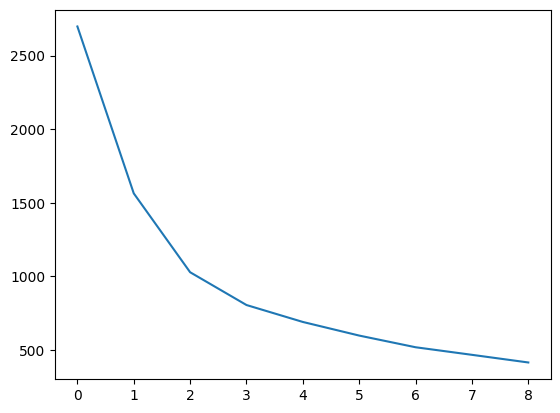

In [46]:
# elbow-curve/SSD
ssd = []
range_n_clusters = range(2,20,2)
for num_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=num_clusters, max_iter=50)
    kmeans.fit(scaler)
    
    ssd.append(kmeans.inertia_)
    
# plot the SSDs for each n_clusters
# ssd
plt.plot(ssd)

In [47]:
# 6 seems to be optimal number of cluster
# silhouette analysis
range_n_clusters = range(2,20,2)

for num_clusters in range_n_clusters:
    
    # intialise kmeans
    kmeans = KMeans(n_clusters=num_clusters, max_iter=50)
    kmeans.fit(scaler)
    
    cluster_labels = kmeans.labels_
    
    # silhouette score
    silhouette_avg = silhouette_score(scaler, cluster_labels)
    print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters, silhouette_avg))
    

For n_clusters=2, the silhouette score is 0.6130258024702675
For n_clusters=4, the silhouette score is 0.4317523534134764
For n_clusters=6, the silhouette score is 0.366236812427496
For n_clusters=8, the silhouette score is 0.3567754347648542
For n_clusters=10, the silhouette score is 0.35038430540881654
For n_clusters=12, the silhouette score is 0.3437973087072107
For n_clusters=14, the silhouette score is 0.3510118875241449
For n_clusters=16, the silhouette score is 0.33874884379391657
For n_clusters=18, the silhouette score is 0.3624330493876093


In [48]:
kmeans = KMeans(n_clusters=6, max_iter=50)
kmeans.fit(scaler)

KMeans(max_iter=50, n_clusters=6)

In [49]:
kmeans.labels_

array([2, 3, 4, ..., 0, 0, 0], dtype=int32)

In [50]:
grouped_df['cluster_id'] = kmeans.labels_
grouped_df.head()

,CUSTOMER_NUMBER,monetory,frequency,recency,cluster_id
1,1076,"4,049,838",125,318,2
2,1146,"1,117,161",60,344,3
3,1154,"40,422,734",94,252,4
4,1192,"83,455",27,374,3
5,1198,"14,073,034",102,313,2


<Axes: xlabel='cluster_id', ylabel='monetory'>

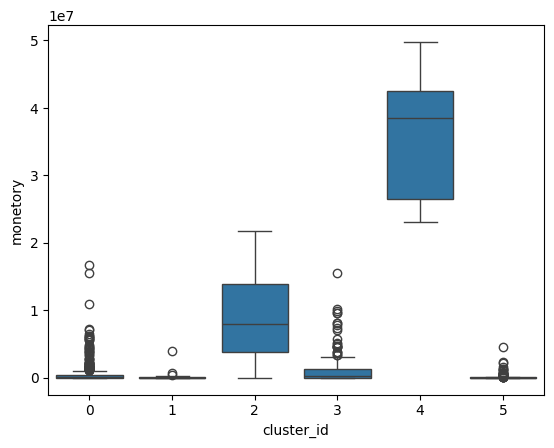

In [51]:
sns.boxplot(x='cluster_id', y='monetory', data=grouped_df)

<Axes: xlabel='cluster_id', ylabel='recency'>

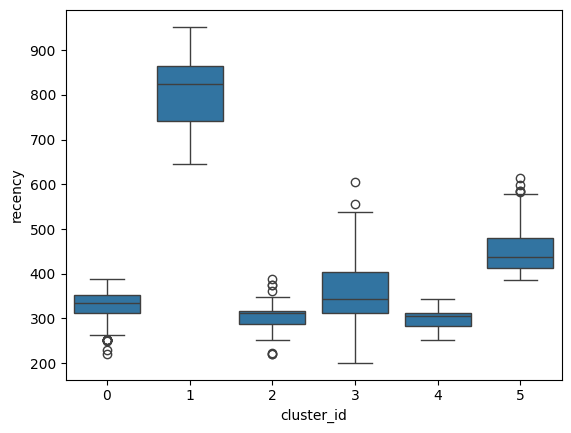

In [52]:
sns.boxplot(x='cluster_id', y='recency', data=grouped_df)

<Axes: xlabel='cluster_id', ylabel='frequency'>

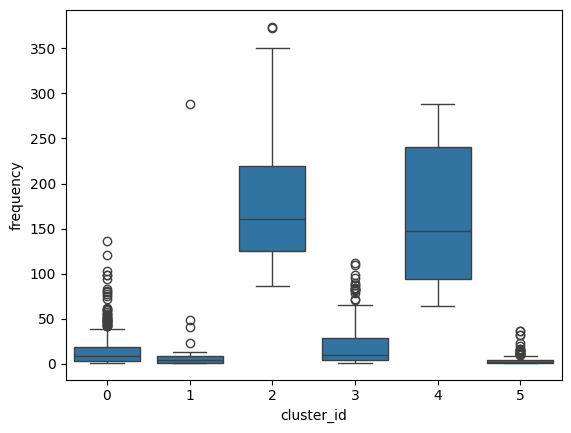

In [53]:
sns.boxplot(x='cluster_id', y='frequency', data=grouped_df)

# This is how we segmented the customers however to build model we need to dive deeper and check individual scenarios/ invoices rather than direct customers


In [55]:
#COming back to past data
past_data.head()

,CUSTOMER_NUMBER,CURRENCY_CODE,USD Amount,INVOICE_ALLOCATED,INVOICE_CREATION_DATE,DUE_DATE,PAYMENT_TERM,INVOICE_CLASS,INVOICE_CURRENCY_CODE,INVOICE_TYPE,is_late_payment
0,37403,USD,"101,019",14200000001,2-Nov-20,2020-12-30,30 Days from EOM,INV,AED,Non Goods,1
1,4003,SAR,"48,990",99200000043,29-Dec-20,2021-01-28,30 Days from Inv Date,INV,SAR,Non Goods,1
2,4003,SAR,"41,992",99210000003,30-Jan-21,2021-03-01,30 Days from Inv Date,INV,SAR,Non Goods,0
3,1409,SAR,"41,992",99200000038,15-Dec-20,2021-01-14,30 Days from Inv Date,INV,SAR,Non Goods,1
4,4003,SAR,"41,992",99200000039,15-Dec-20,2021-01-14,30 Days from Inv Date,INV,SAR,Non Goods,1


In [56]:
past_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93937 entries, 0 to 93936
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   CUSTOMER_NUMBER        93937 non-null  int64         
 1   CURRENCY_CODE          93937 non-null  object        
 2   USD Amount             93937 non-null  float64       
 3   INVOICE_ALLOCATED      93937 non-null  object        
 4   INVOICE_CREATION_DATE  93937 non-null  object        
 5   DUE_DATE               93937 non-null  datetime64[ns]
 6   PAYMENT_TERM           93937 non-null  object        
 7   INVOICE_CLASS          93937 non-null  object        
 8   INVOICE_CURRENCY_CODE  93937 non-null  object        
 9   INVOICE_TYPE           93937 non-null  object        
 10  is_late_payment        93937 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(2), object(7)
memory usage: 7.9+ MB


In [57]:
past_data.INVOICE_CLASS.value_counts(normalize=True)

INVOICE_CLASS
INV   1
CM    0
DM    0
Name: proportion, dtype: float64

In [58]:
past_data=past_data.drop("INVOICE_CLASS",axis=1)

<Axes: >

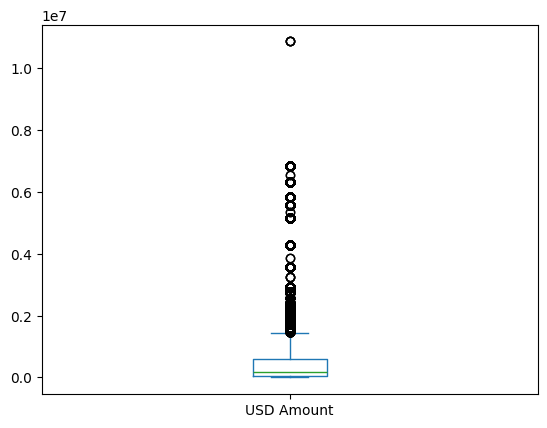

In [59]:
past_data['USD Amount'].plot(kind='box')

In [60]:
past_data[past_data['USD Amount']<0]

,CUSTOMER_NUMBER,CURRENCY_CODE,USD Amount,INVOICE_ALLOCATED,INVOICE_CREATION_DATE,DUE_DATE,PAYMENT_TERM,INVOICE_CURRENCY_CODE,INVOICE_TYPE,is_late_payment


In [61]:
past_data['USD Amount'].min()

0.0

In [62]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()

In [63]:
categorical_cols=["INVOICE_TYPE",'PAYMENT_TERM']

In [64]:
past_data[categorical_cols]=past_data[categorical_cols].apply(le.fit_transform)

In [65]:
le1=preprocessing.LabelEncoder()
past_data['INVOICE_CURRENCY_CODE']=past_data[['INVOICE_CURRENCY_CODE']].apply(le1.fit_transform)
past_data.INVOICE_CURRENCY_CODE

0        0
1        7
2        7
3        7
4        7
        ..
93932    8
93933    8
93934    8
93935    0
93936    0
Name: INVOICE_CURRENCY_CODE, Length: 93937, dtype: int64

In [66]:
past_data['days_span']=past_data.DUE_DATE-pd.to_datetime(past_data.INVOICE_CREATION_DATE,format="%d-%b-%y")

In [67]:
past_data['days_span']=past_data.days_span.dt.days

In [68]:
past_data=past_data.drop(['INVOICE_CREATION_DATE','DUE_DATE','CURRENCY_CODE','INVOICE_ALLOCATED','INVOICE_TYPE'],axis=1)

In [69]:
# Putting feature variable to X
X=past_data.drop('is_late_payment',axis=1)
y=past_data.is_late_payment

# train test split

In [71]:
from sklearn.model_selection import train_test_split

In [72]:
X_train,X_test,y_train,y_test=train_test_split(X,y,random_state=40)

In [73]:
X_train.shape,y_train.shape,X_test.shape,y_test.shape

((70452, 5), (70452,), (23485, 5), (23485,))

In [74]:
from sklearn.tree import DecisionTreeClassifier

In [75]:
dt = DecisionTreeClassifier(max_depth=3)
dt.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3)

In [76]:
# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

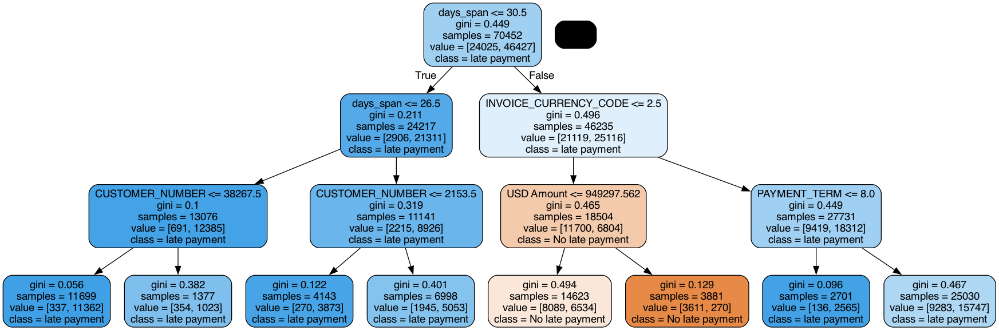

In [77]:
# plotting tree with max_depth=3
dot_data = StringIO()  

export_graphviz(dt, out_file=dot_data, filled=True, rounded=True,
                feature_names=X.columns, 
                class_names=['No late payment', "late payment"])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [78]:
y_train_pred = dt.predict(X_train)
y_test_pred = dt.predict(X_test)

In [79]:
from sklearn.metrics import confusion_matrix,accuracy_score

In [80]:
print(accuracy_score(y_train, y_train_pred))
confusion_matrix(y_train, y_train_pred)

0.7284818032135355


array([[11700, 12325],
       [ 6804, 39623]])

In [81]:
print(accuracy_score(y_test, y_test_pred))
confusion_matrix(y_test, y_test_pred)

0.7303810943155206


array([[ 3824,  4110],
       [ 2222, 13329]])

# Accuracy score is pretty close but lets check with grid search.


In [83]:
def get_dt_graph(dt_classifier):
    dot_data = StringIO()
    export_graphviz(dt_classifier, out_file=dot_data, filled=True,rounded=True,
                    feature_names=X.columns, 
                    class_names=['Disease', "No Disease"])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph

In [84]:
def evaluate_model(dt_classifier):
    print("Train Accuracy :", accuracy_score(y_train, dt_classifier.predict(X_train)))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_train, dt_classifier.predict(X_train)))
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test, dt_classifier.predict(X_test)))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test, dt_classifier.predict(X_test)))

In [85]:
from sklearn.model_selection import GridSearchCV

In [86]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [2, 3, 5, 10],
    'min_samples_leaf': [ 10, 20, 50, 100],
    'criterion': ["gini", "entropy"]
}

In [87]:
#Instantiate the grid search model
grid_search = GridSearchCV(estimator=dt, 
                           param_grid=params, 
                           cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

In [88]:
grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 32 candidates, totalling 128 fits


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(max_depth=3), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10],
                         'min_samples_leaf': [10, 20, 50, 100]},
             scoring='accuracy', verbose=1)

In [89]:
score_df = pd.DataFrame(grid_search.cv_results_)
score_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,0,0,0,0,gini,2,10,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",1,1,1,1,1,0,17
1,0,0,0,0,gini,2,20,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",1,1,1,1,1,0,17
2,0,0,0,0,gini,2,50,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",1,1,1,1,1,0,17
3,0,0,0,0,gini,2,100,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",1,1,1,1,1,0,17
4,0,0,0,0,gini,3,10,"{'criterion': 'gini', 'max_depth': 3, 'min_sam...",1,1,1,1,1,0,17


# Grid search approach for hyper parameter tuning

In [91]:
# Lets check the best estimator
dt_best = grid_search.best_estimator_

In [92]:
dt_best.get_params

<bound method BaseEstimator.get_params of DecisionTreeClassifier(max_depth=10, min_samples_leaf=10)>

In [93]:
evaluate_model(dt_best)

Train Accuracy : 0.8444330891954807
Train Confusion Matrix:
[[16264  7761]
 [ 3199 43228]]
--------------------------------------------------
Test Accuracy : 0.8367042793272301
Test Confusion Matrix:
[[ 5237  2697]
 [ 1138 14413]]


- train accusracy: 84.43
- Test Accuracy: 83.66
# WIth less than 1 % of test and train prediction difference we are pretty close to optimal solution.

In [95]:
from sklearn.metrics import classification_report, precision_score, recall_score

In [96]:
print(classification_report(y_test, dt_best.predict(X_test)))

              precision    recall  f1-score   support

           0       0.82      0.66      0.73      7934
           1       0.84      0.93      0.88     15551

    accuracy                           0.84     23485
   macro avg       0.83      0.79      0.81     23485
weighted avg       0.84      0.84      0.83     23485



dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.558535 to fit



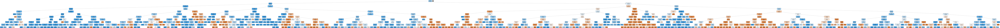

In [97]:
gph = get_dt_graph(dt_best)
Image(gph.create_png())

In [98]:
test_precision=precision_score(y_test,y_test_pred)
test_precision

0.764321348701187

In [99]:
train_precision=precision_score(y_train,y_train_pred)
train_precision

0.7627435127435127

In [100]:
train_recall=recall_score(y_true=y_train, y_pred=y_train_pred)
train_recall

0.8534473474486829

In [101]:
test_recall=recall_score(y_test,y_test_pred)
test_recall

0.8571152980515723

# Lets see if we can improve recall

In [103]:
from sklearn.ensemble import RandomForestClassifier

In [104]:
classifier_rf = RandomForestClassifier(random_state=42, n_jobs=-1, oob_score=True)

In [105]:
params = {
    'max_depth': [1, 2, 5, 10],
    'min_samples_leaf': [ 10, 20, 50, 100],
    'max_features': [2,3,4],
    'n_estimators': [10, 30, 50, 100]
}

In [106]:
# Instantiate the grid search model
grid_search = GridSearchCV(estimator=classifier_rf, param_grid=params, 
                          cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

In [107]:
grid_search.fit(X_train,y_train)

Fitting 4 folds for each of 192 candidates, totalling 768 fits


/opt/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:583: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:583: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:583: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:583: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:583: UserWarning: Some inputs do not have OOB scores. This p

GridSearchCV(cv=4,
             estimator=RandomForestClassifier(n_jobs=-1, oob_score=True,
                                              random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [1, 2, 5, 10], 'max_features': [2, 3, 4],
                         'min_samples_leaf': [10, 20, 50, 100],
                         'n_estimators': [10, 30, 50, 100]},
             scoring='accuracy', verbose=1)

In [108]:
rf_best = grid_search.best_estimator_
rf_best

RandomForestClassifier(max_depth=10, max_features=4, min_samples_leaf=10,
                       n_jobs=-1, oob_score=True, random_state=42)

In [109]:
evaluate_model(rf_best)

Train Accuracy : 0.8624737409867711
Train Confusion Matrix:
[[16675  7350]
 [ 2339 44088]]
--------------------------------------------------
Test Accuracy : 0.8545454545454545
Test Confusion Matrix:
[[ 5373  2561]
 [  855 14696]]


# Wr have increased accuracy by 1 % LETS CHECK RECALL


In [111]:
y_train_pred=rf_best.predict(X_train)

In [112]:
y_test_pred=rf_best.predict(X_test)

In [113]:
confusion_matrix(y_test,y_test_pred)

array([[ 5373,  2561],
       [  855, 14696]])

In [114]:
train_recall=recall_score(y_train,y_train_pred)
train_recall

0.9496198332866651

In [115]:
test_recall=recall_score(y_test,y_test_pred)
test_recall

0.945019612886631

# Our recall score have improved significantly with this random forest model rf_best

# Final models specification: 
- max_depth=10,
- max_features=4, 
- min_samples_leaf=10,

# Models score: 
 - train accuracy: 86.25
 - test accuracy: 85.45
 - train recall: 94.96
 - test recall: 94.50

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.668605 to fit



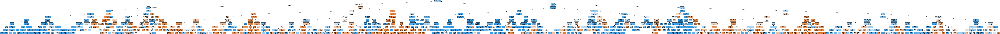

In [119]:
# Lets see one of the tree
gph = get_dt_graph(rf_best.estimators_[0])
Image(gph.create_png(), height=600, width=600)

# Now lets predict unseen data.

In [121]:
X_test.columns

Index(['CUSTOMER_NUMBER', 'USD Amount', 'PAYMENT_TERM',
       'INVOICE_CURRENCY_CODE', 'days_span'],
      dtype='object')

In [122]:
future_data=pd.read_csv("open_invoice_data.csv", encoding ="latin1")
future_data.columns

Index(['AS_OF_DATE', 'Customer Type', 'Customer_Name', 'Customer Account No',
       'Transaction Number', 'Transaction Date', 'Payment Term', 'Due Date',
       'Transaction Currency', 'Local Amount', 'Transaction Class', 'AGE',
       'USD Amount', 'INV_CREATION_DATE'],
      dtype='object')

In [123]:
future_data=future_data.drop(['AS_OF_DATE','Customer Type','Transaction Number','Transaction Date','AGE','Local Amount','Customer_Name','Transaction Class'], axis=1)

In [124]:
future_data.rename(columns={'Customer Account No': 'CUSTOMER_NUMBER'}, inplace=True)

In [125]:
future_data['INV_CREATION_DATE']=pd.to_datetime(future_data.INV_CREATION_DATE, format="%m/%d/%Y %H:%M")

In [126]:
future_data['Due Date']=pd.to_datetime(future_data["Due Date"], format="%d/%m/%Y")

In [127]:
future_data['days_span']=(future_data['Due Date']-future_data.INV_CREATION_DATE).dt.days

In [128]:
future_data=future_data.drop(['Due Date','INV_CREATION_DATE',], axis=1)

In [129]:
future_data.rename(columns={'Payment Term': 'PAYMENT_TERM'}, inplace=True)

In [130]:
future_data.rename(columns={'Transaction Currency': 'INVOICE_CURRENCY_CODE'}, inplace=True)

In [131]:
future_data.head()

,CUSTOMER_NUMBER,PAYMENT_TERM,INVOICE_CURRENCY_CODE,USD Amount,days_span
0,"49,144",Immediate,AED,"-3,088",-1
1,"23,152",30 Days from Inv Date,USD,"2,000",29
2,"23,152",30 Days from Inv Date,USD,"2,000",29
3,"23,312",15 Days from Inv Date,AED,"2,415",13
4,"7,530",30 Days from EOM,AED,"3,800",57


In [132]:
future_data= future_data[~future_data["USD Amount"].str.startswith('-')]

In [133]:
future_data["USD Amount"]=future_data["USD Amount"].str.replace(',', '').astype('int')

In [134]:
X.PAYMENT_TERM.head()

0     9
1    10
2    10
3    10
4    10
Name: PAYMENT_TERM, dtype: int64

In [135]:
future_data['PAYMENT_TERM']=future_data.PAYMENT_TERM.apply(lambda x: le.transform([x])[0] if x in le.classes_ else -1)

In [136]:
future_data['INVOICE_CURRENCY_CODE']=future_data.INVOICE_CURRENCY_CODE.apply(lambda x: le1.transform([x])[0] if x in le1.classes_ else -1)

In [137]:
new_columns_order=X.columns

In [138]:
future_data=future_data[new_columns_order]

In [139]:
future_data.INVOICE_CURRENCY_CODE.head()

1    8
2    8
3    0
4    0
5    0
Name: INVOICE_CURRENCY_CODE, dtype: int64

In [140]:
future_data['prediction']=rf_best.predict(future_data)

In [141]:
future_data.head()

,CUSTOMER_NUMBER,USD Amount,PAYMENT_TERM,INVOICE_CURRENCY_CODE,days_span,prediction
1,"23,152",2000,10,8,29,1
2,"23,152",2000,10,8,29,1
3,"23,312",2415,4,0,13,1
4,"7,530",3800,9,0,57,0
5,"7,530",1264,9,0,57,0
